In [1]:
%load_ext autoreload
%autoreload 2
from threader   import Threader
from geometry   import GSegment, GPoint, list2gsegments
from tlayer     import TLayer
from gcode_file import GcodeFile
from pathlib    import Path

import logger, plotting, plot_styles
import plot_helpers, util
import sys

#This module has settings specific to our current printer setup
try:
    import ender3v2 as ender3
except ImportError:
    import ender3

Loaded ring: {'center': {-10.50, -74.20,   0.00}, 'radius': 93, 'angle': 90.000°, 'home_angle': 90.000°, 
'min_move': 0.113°, 'feedrate': 5000, 'motor_gear_teeth': 19, 'ring_gear_teeth': 112, 
'stepper_microsteps_per_rotation': 3200}

Loaded bed: {'zero': {-52.50, -65.00,   0.00}, 'size': [110, 220], 'anchor': {-72.50, -65.00,   0.00}}

Ring relative to bed zero: {'center': { 42.00,  -9.20,   0.00}, 'radius': 93, 'angle': 90.000°, 'home_angle': 
90.000°, 'min_move': 0.113°, 'feedrate': 5000, 'motor_gear_teeth': 19, 'ring_gear_teeth': 112, 
'stepper_microsteps_per_rotation': 3200}

Bed now: {'zero': {  0.00,   0.00,   0.00}, 'size': [110, 220], 'anchor': {-20.00,   0.00,   0.00}}

reload threader

In [2]:
test_root = Path('./example/bracelet/')
gcode_filename = test_root.joinpath('bracelet-cura5.gcode')
thread_geom = [
    [47.9130, 91.2271, 3.3300],
    [37.7413, 97.0997, 3.3300],
    [31.8687, 107.2714, 3.3300],
    [31.8687, 119.0167, 3.3300],
    [37.7413, 129.1884, 3.3300],
    [47.9130, 135.0611, 3.3300],
    [59.6583, 135.0611, 3.3300],
    [69.8300, 129.1884, 3.3300],
    [75.7026, 119.0167, 3.3300],
    [75.7026, 107.2714, 3.3300],
    [69.8300, 97.0997, 3.3300],
    [59.6583, 91.2271, 3.3300],
    [48.1718, 92.1930, 3.3300],
    [47.8936, 91.2396, 6.6600],
    [37.7308, 97.1202, 6.6600],
    [31.8698, 107.2945, 6.6600],
    [31.8812, 119.0361, 6.6600],
    [37.7618, 129.1989, 6.6600],
    [47.9360, 135.0599, 6.6600],
    [59.6776, 135.0485, 6.6600],
    [69.8405, 129.1679, 6.6600],
    [75.7015, 118.9937, 6.6600],
    [75.6901, 107.2521, 6.6600],
    [69.8095, 97.0892, 6.6600],
    [59.6583, 91.2271, 6.6600],
    [48.1718, 92.1930, 6.6600]]

In [4]:
gcode = GcodeFile(gcode_filename, layer_class=TLayer)
threader = Threader(gcode, 'ender3.yaml')
logger.restart_logging()
threader.route_model(thread_geom)#, end_layer=17)

Accordion()

In [5]:
threader.save(test_root.joinpath('bracelet-routed.gcode'))

Init: {'center': { 42.00,  -9.20,   0.00}, 'radius': 93, 'angle': 90.000°, 'home_angle': 90.000°, 'min_move': 
0.113°, 'feedrate': 5000, 'motor_gear_teeth': 19, 'ring_gear_teeth': 112, 'stepper_microsteps_per_rotation': 3200}

In [24]:
%debug

> /home/jovyan/work/data/projects/research/thread_printer/rhapso/ender3.py(217)gcfunc_set_axis_value()
    215                         current_thread  = GSegment(self.anchor, self.ring.point).as2d()
    216                         ring_move_by = self._calc_new_ring_angle(current_thread, gcline.y)
--> 217                         if (gcline.lineno or 100) < 25 or 23212 >= gcline.lineno >= 23213:
    218                                 print(f'{gcline}')
    219                                 print(f'\t{self.ring.angle=}')



ipdb>  gcline.lineno


''


ipdb>  gcline


G1 X51.125 Y92.02 E563.43345


ipdb>  q


In [13]:
fig = plot_helpers.quickplot(**threader.layer_steps[-1].printer._debug_quickplot_args, show=False)
plot_helpers.add_circles(fig, [list(threader.layer_steps[-1].printer._debug_quickplot_args['gc_segs'])[0].start_point])
plot_helpers.show_dark(fig)

AttributeError: 'Ender3' object has no attribute '_debug_quickplot_args'

In [ ]:
test_layer = 16
out_gcode = threader.layer_steps[test_layer].gcode()
fig = plotting.animate_gcode(out_gcode, ender3.bed_config, ender3.ring_config, start_angle=279.253)

In [6]:
%debug

> /tmp/ipykernel_87540/1155535953.py(3)<module>()
      1 test_layer = 16
      2 out_gcode = threader.layer_steps[test_layer].gcode()
----> 3 fig = plotting.animate_gcode(out_gcode, ender3.bed_config, ender3.ring_config, start_angle=threader.layer_steps[test_layer-1].steps[-1].ring_angle)



ipdb>  len(threader.layer_steps)


50


ipdb>  threader.layer_steps[test_layer-1]


0 Steps for layer <Layer 15 at Z=3.2;
  corners: ((29.321, 88.679), (78.25, 137.609));
  1220 lines>



ipdb>  q


Preview of 54 steps for layer 16


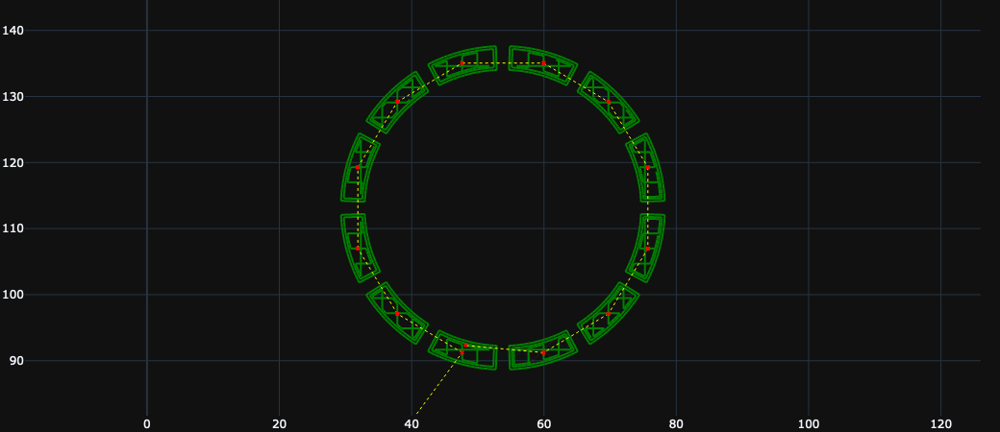

Skip 0
Step 1: Print 923 segments thread doesn't intersect
H({-20.00,   0.00,   3.40}, ↗ 90.00° (  0.00,   1.00,   0.00))


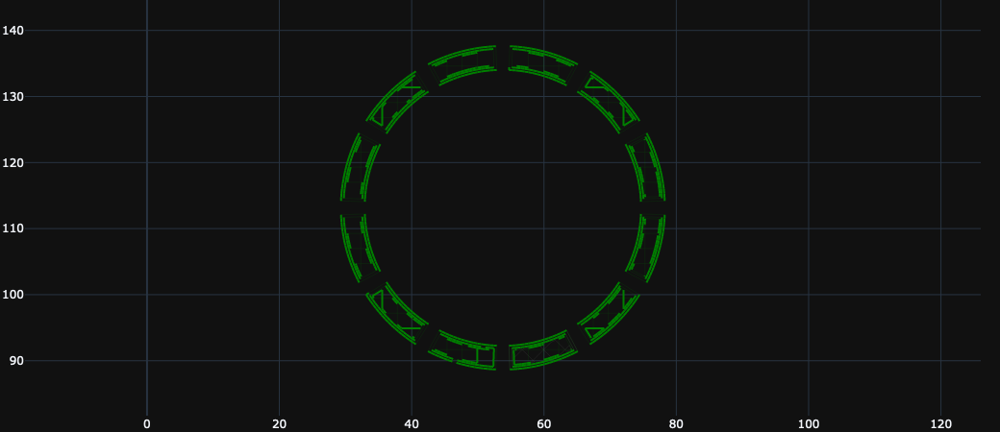

Step 2: Rotate thread at {-20.00,   0.00,   3.40} to overlap next anchor at { 47.63,  91.23,   3.40}
H({-20.00,   0.00,   3.40}, ↗ 53.45° ( 67.63,  91.23,   0.00))


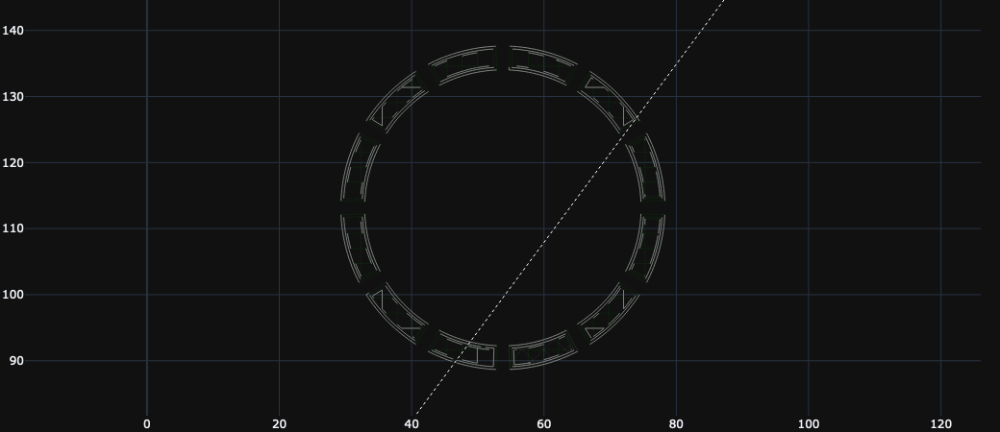

Step 3: Print 1 segment to fix anchor
H({ 47.63,  91.23,   3.40}, ↗ 53.45° ( 67.63,  91.23,   0.00))


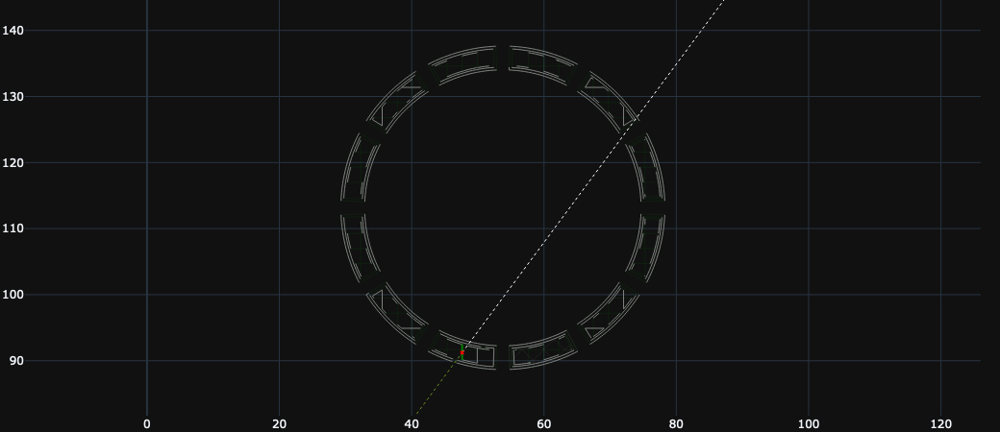

Skip 4
Step 5: Print 2 segments thread doesn't intersect
H({ 47.63,  91.23,   3.40}, ↗ 53.45° ( 67.63,  91.23,   0.00))


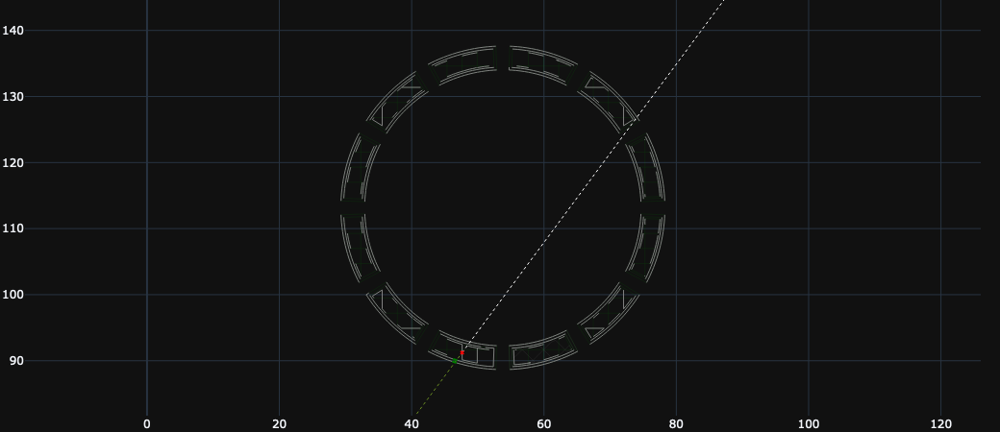

Step 6: Rotate thread at { 47.63,  91.23,   3.40} to overlap next anchor at { 37.83,  97.10,   3.40}
H({ 47.63,  91.23,   3.40}, ↗149.06° ( -9.79,   5.87,   0.00))


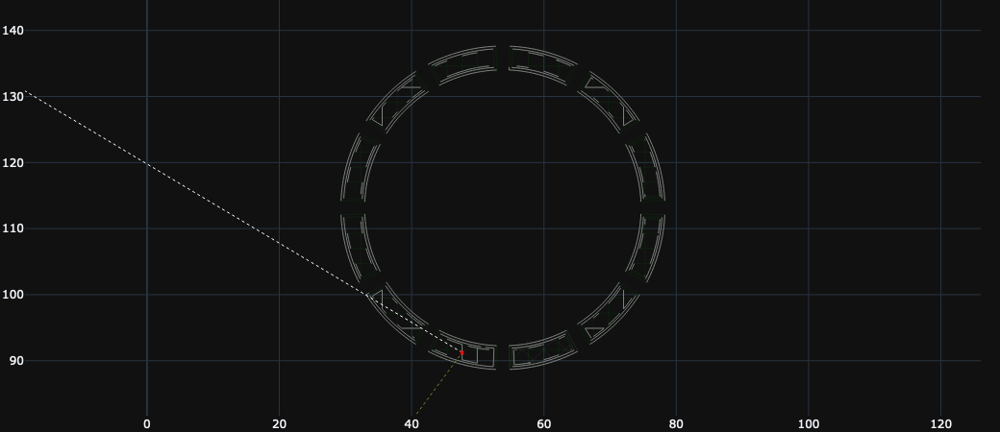

Step 7: Print 1 segment to fix anchor
H({ 37.83,  97.10,   3.40}, ↗149.06° ( -9.79,   5.87,   0.00))


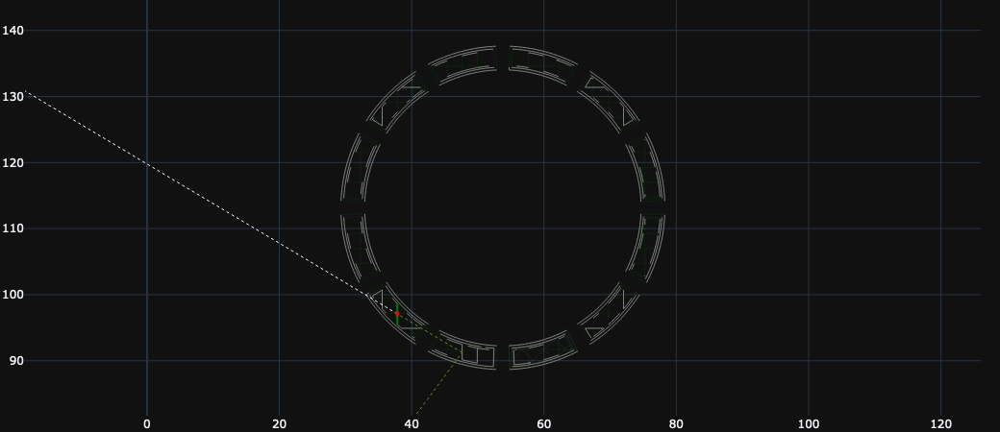

Skip 8
Step 9: Print 8 segments thread doesn't intersect
H({ 37.83,  97.10,   3.40}, ↗149.06° ( -9.79,   5.87,   0.00))


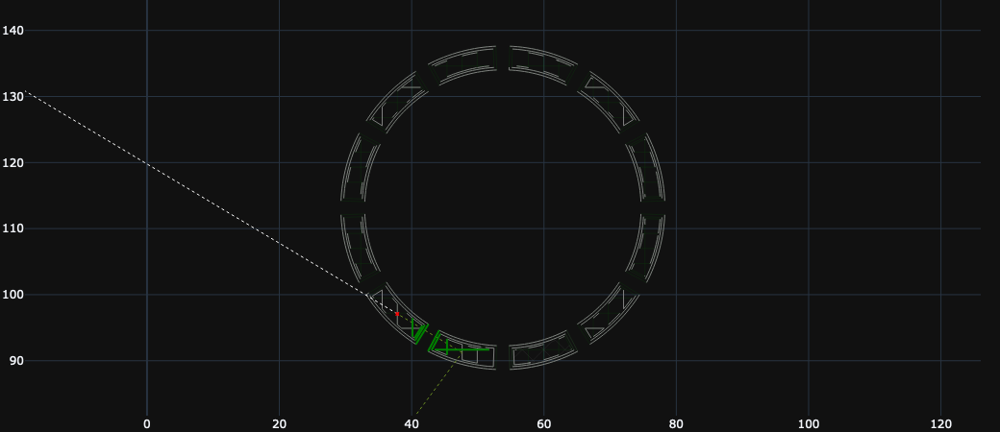

Step 10: Rotate thread at { 37.83,  97.10,   3.40} to overlap next anchor at { 31.87, 106.99,   3.40}
H({ 37.83,  97.10,   3.40}, ↗121.10° ( -5.97,   9.89,   0.00))


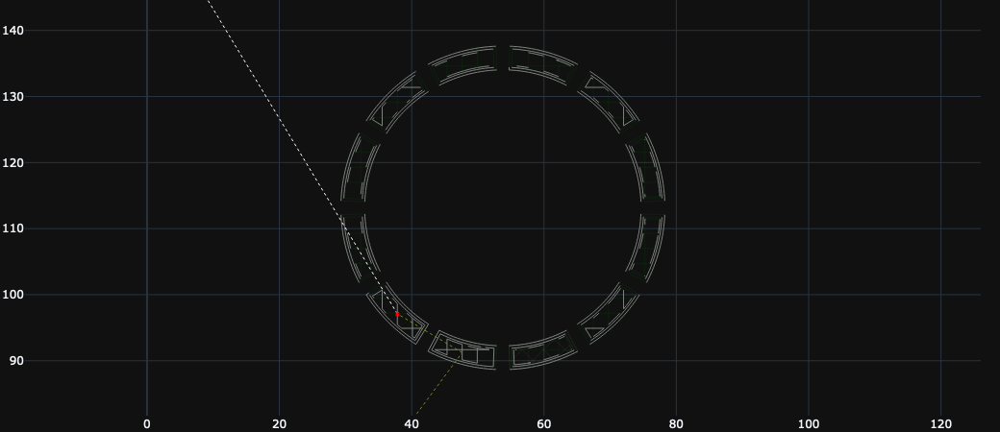

Step 11: Print 1 segment to fix anchor
H({ 31.87, 106.99,   3.40}, ↗121.10° ( -5.97,   9.89,   0.00))


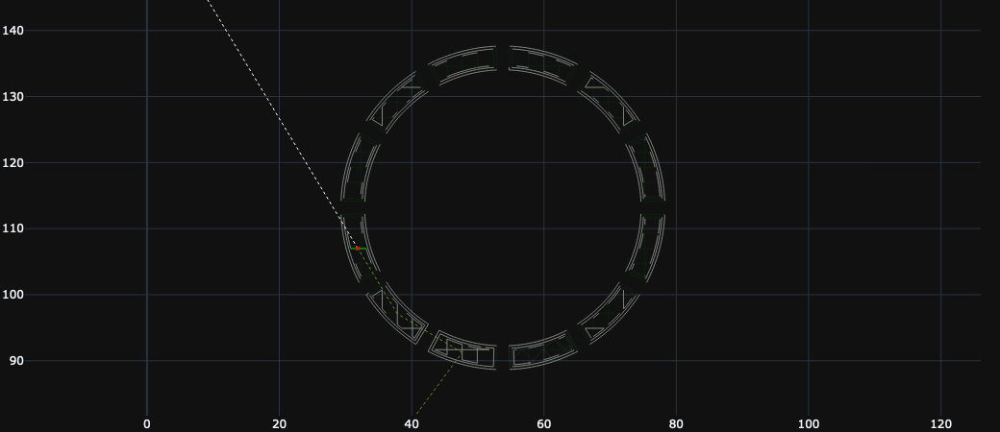

Skip 12
Step 13: Print 8 segments thread doesn't intersect
H({ 31.87, 106.99,   3.40}, ↗121.10° ( -5.97,   9.89,   0.00))


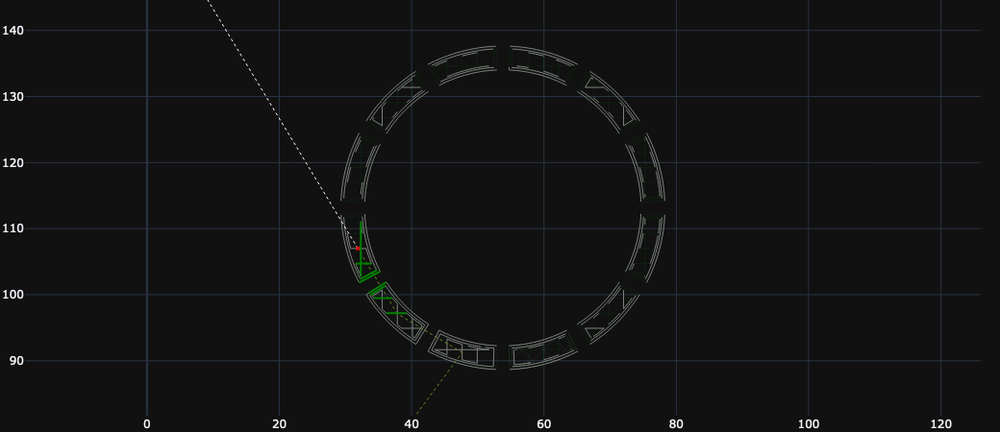

Step 14: Rotate thread at { 31.87, 106.99,   3.40} to overlap next anchor at { 31.87, 119.30,   3.40}
H({ 31.87, 106.99,   3.40}, ↗ 90.00° (  0.00,  12.31,   0.00))


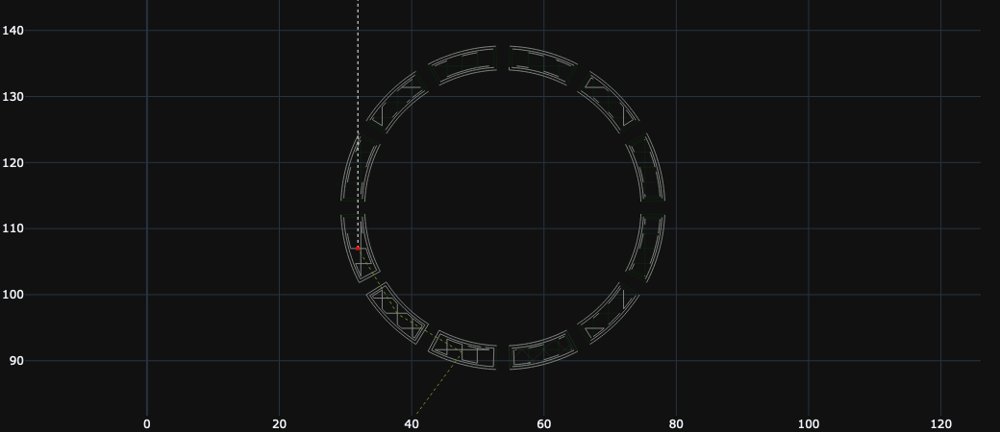

Step 15: Print 1 segment to fix anchor
H({ 31.87, 119.30,   3.40}, ↗ 90.00° (  0.00,  12.31,   0.00))


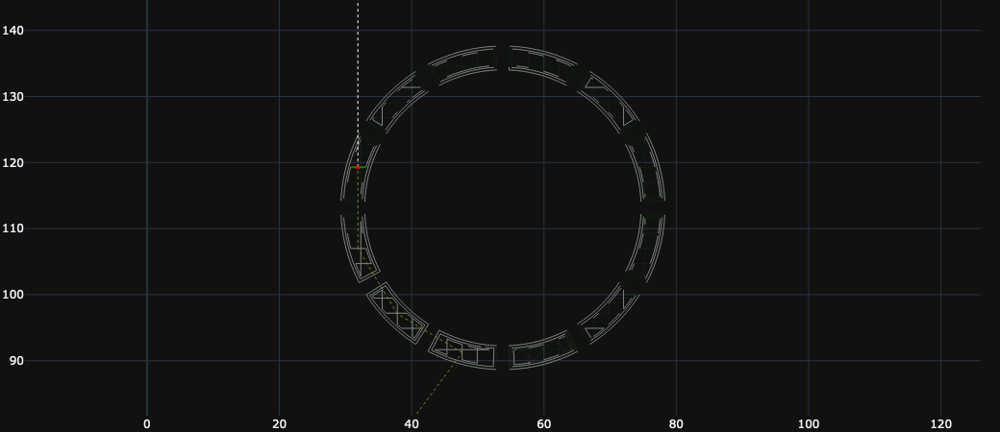

Skip 16
Step 17: Print 6 segments thread doesn't intersect
H({ 31.87, 119.30,   3.40}, ↗ 90.00° (  0.00,  12.31,   0.00))


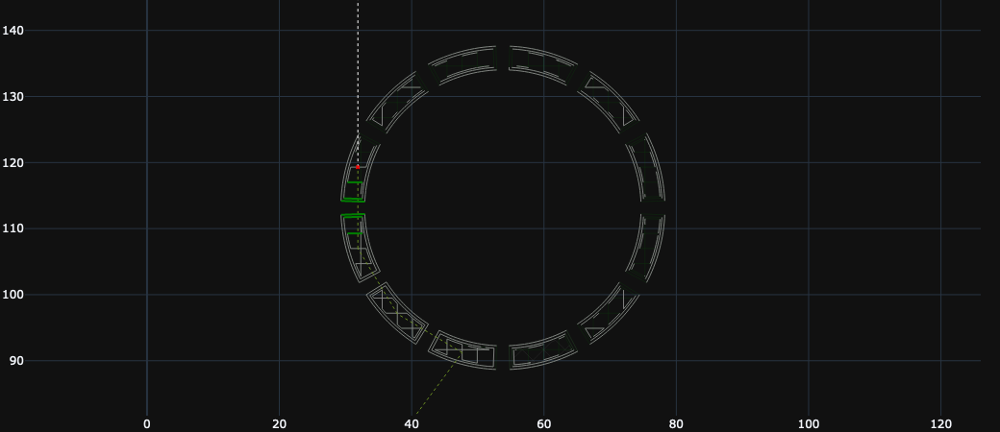

Step 18: Rotate thread at { 31.87, 119.30,   3.40} to overlap next anchor at { 37.83, 129.19,   3.40}
H({ 31.87, 119.30,   3.40}, ↗ 58.90° (  5.97,   9.89,   0.00))


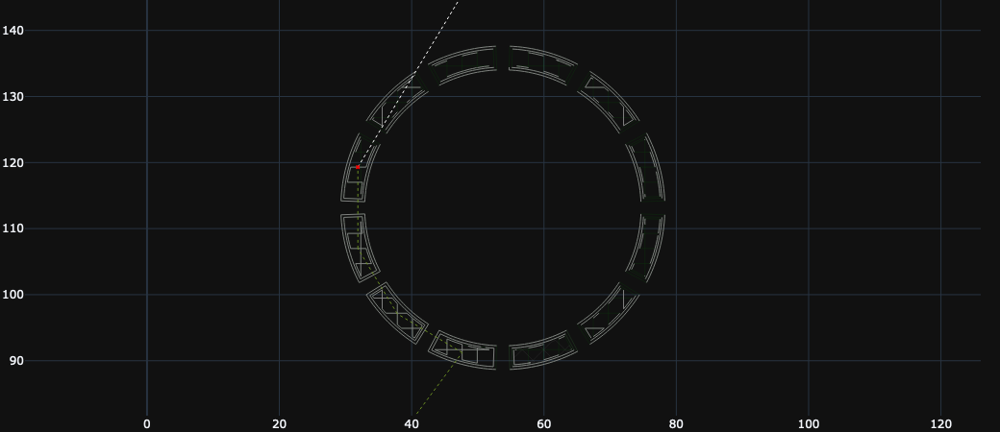

Step 19: Print 1 segment to fix anchor
H({ 37.83, 129.19,   3.40}, ↗ 58.90° (  5.97,   9.89,   0.00))


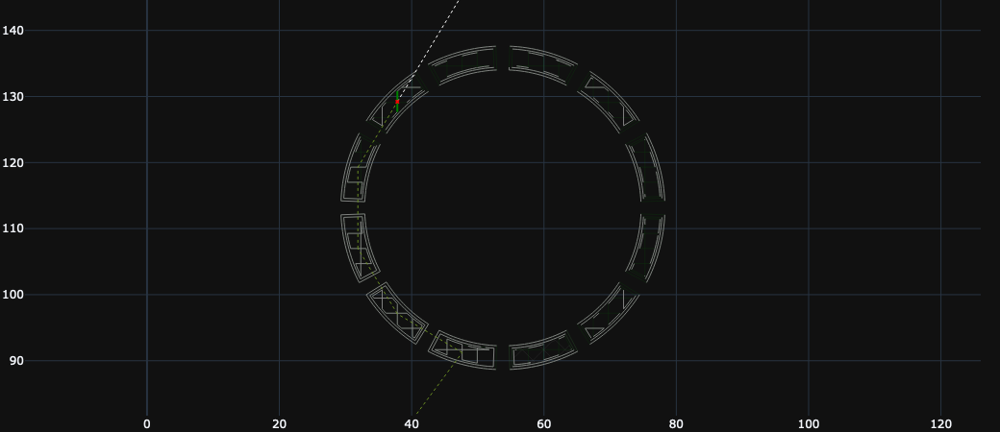

Skip 20
Step 21: Print 8 segments thread doesn't intersect
H({ 37.83, 129.19,   3.40}, ↗ 58.90° (  5.97,   9.89,   0.00))


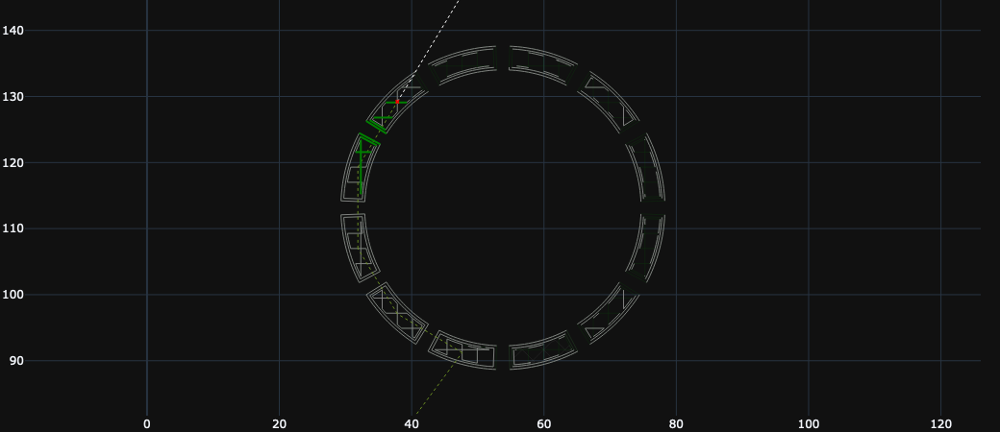

Step 22: Rotate thread at { 37.83, 129.19,   3.40} to overlap next anchor at { 47.63, 135.06,   3.40}
H({ 37.83, 129.19,   3.40}, ↗ 30.95° (  9.79,   5.87,   0.00))


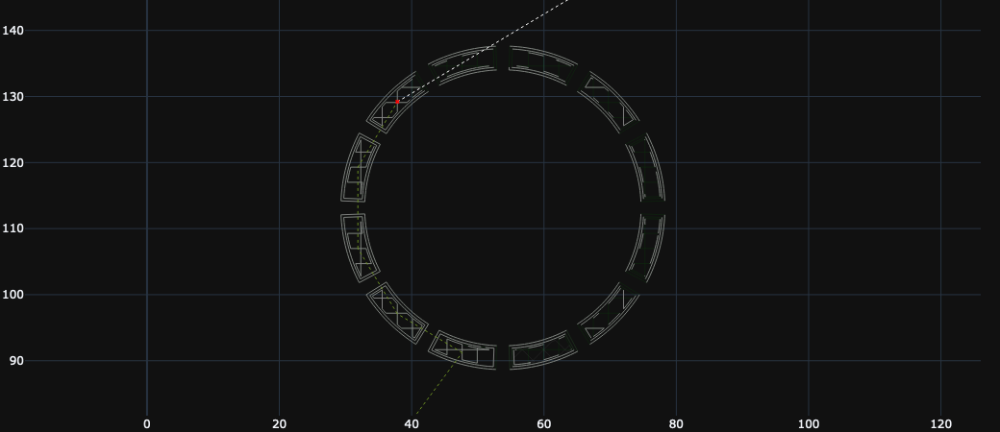

Step 23: Print 1 segment to fix anchor
H({ 47.63, 135.06,   3.40}, ↗ 30.95° (  9.79,   5.87,   0.00))


Skip 24
Step 25: Print 8 segments thread doesn't intersect
H({ 47.63, 135.06,   3.40}, ↗ 30.95° (  9.79,   5.87,   0.00))


Step 26: Rotate thread at { 47.63, 135.06,   3.40} to overlap next anchor at { 59.94, 135.06,   3.40}
H({ 47.63, 135.06,   3.40}, ↗  0.00° ( 12.31,   0.00,   0.00))


Step 27: Print 1 segment to fix anchor
H({ 59.94, 135.06,   3.40}, ↗  0.00° ( 12.31,   0.00,   0.00))


Skip 28
Step 29: Print 6 segments thread doesn't intersect
H({ 59.94, 135.06,   3.40}, ↗  0.00° ( 12.31,   0.00,   0.00))


Step 30: Rotate thread at { 59.94, 135.06,   3.40} to overlap next anchor at { 69.74, 129.19,   3.40}
H({ 59.94, 135.06,   3.40}, ↗-30.95° (  9.79,  -5.87,   0.00))


Step 31: Print 1 segment to fix anchor
H({ 69.74, 129.19,   3.40}, ↗-30.95° (  9.79,  -5.87,   0.00))


Skip 32
Step 33: Print 7 segments thread doesn't intersect
H({ 69.74, 129.19,   3.40}, ↗-30.95° (  9.79,  -5.87,   0.00))


Step 34: Rotate thread at { 69.74, 129.19,   3.40} to overlap next anchor at { 75.70, 119.30,   3.40}
H({ 69.74, 129.19,   3.40}, ↗-58.90° (  5.97,  -9.89,   0.00))


Step 35: Print 1 segment to fix anchor
H({ 75.70, 119.30,   3.40}, ↗-58.90° (  5.97,  -9.89,   0.00))


Skip 36
Step 37: Print 9 segments thread doesn't intersect
H({ 75.70, 119.30,   3.40}, ↗-58.90° (  5.97,  -9.89,   0.00))


Step 38: Rotate thread at { 75.70, 119.30,   3.40} to overlap next anchor at { 75.70, 106.99,   3.40}
H({ 75.70, 119.30,   3.40}, ↗-90.00° (  0.00, -12.31,   0.00))


Step 39: Print 1 segment to fix anchor
H({ 75.70, 106.99,   3.40}, ↗-90.00° (  0.00, -12.31,   0.00))


Skip 40
Step 41: Print 8 segments thread doesn't intersect
H({ 75.70, 106.99,   3.40}, ↗-90.00° (  0.00, -12.31,   0.00))


Step 42: Rotate thread at { 75.70, 106.99,   3.40} to overlap next anchor at { 69.74,  97.10,   3.40}
H({ 75.70, 106.99,   3.40}, ↗-121.11° ( -5.97,  -9.89,   0.00))


Step 43: Print 1 segment to fix anchor
H({ 69.74,  97.10,   3.40}, ↗-121.11° ( -5.97,  -9.89,   0.00))


Skip 44
Step 45: Print 10 segments thread doesn't intersect
H({ 69.74,  97.10,   3.40}, ↗-121.11° ( -5.97,  -9.89,   0.00))


Step 46: Rotate thread at { 69.74,  97.10,   3.40} to overlap next anchor at { 59.94,  91.23,   3.40}
H({ 69.74,  97.10,   3.40}, ↗-149.06° ( -9.79,  -5.87,   0.00))


Step 47: Print 1 segment to fix anchor
H({ 59.94,  91.23,   3.40}, ↗-149.06° ( -9.79,  -5.87,   0.00))


Skip 48
Step 49: Print 8 segments thread doesn't intersect
H({ 59.94,  91.23,   3.40}, ↗-149.06° ( -9.79,  -5.87,   0.00))


Step 50: Rotate thread at { 59.94,  91.23,   3.40} to overlap next anchor at { 48.20,  92.31,   3.40}
H({ 59.94,  91.23,   3.40}, ↗174.73° (-11.74,   1.08,   0.00))


Step 51: Print 1 segment to fix anchor
H({ 48.20,  92.31,   3.40}, ↗174.73° (-11.74,   1.08,   0.00))


Skip 52
Step 53: Print 6 segments thread doesn't intersect
H({ 48.20,  92.31,   3.40}, ↗174.73° (-11.74,   1.08,   0.00))


Finished routing this layer


[Figure({
     'data': [{'line': {'color': 'gray', 'width': 0.5},
               'mode': 'lines',
               'name': "Ex'wall-inner'",
               'opacity': 0.25,
               'type': 'scatter',
               'x': [63.245, 64.56, None, 64.56, 63.862, None, 63.862, 63.23, None,
                     63.23, 62.579, None, 62.579, 61.962, None, 61.962, 61.311,
                     None, 61.311, 60.66, None, 60.66, 60.019, None, 60.019, 59.34,
                     None, 59.34, 58.67, None, 58.67, 58.02, None, 58.02, 57.327,
                     None, 57.327, 56.668, None, 56.668, 55.99, None, 55.99, 55.227,
                     None, 55.227, 55.128, None, 55.128, 55.825, None, 55.825,
                     56.46, None, 56.46, 57.098, None, 57.098, 57.718, None, 57.718,
                     58.368, None, 58.368, 58.995, None, 58.995, 59.616, None,
                     59.616, 60.23, None, 60.23, 60.842, None, 60.842, 61.419, None,
                     61.419, 62.034, None, 62.034, 6

In [6]:
test_layer = 16
plotting.plot_steps(threader.layer_steps[test_layer], prev_layer=gcode.layers[test_layer-1], prev_layer_only_outline=False, preview_layer=True)